In [ ]:
import requests
from time import sleep, time
import json
import re
from collections import Counter

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from tqdm import tqdm
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

from catboost import CatBoostRegressor

sns.set(style="whitegrid", font_scale=1.3, palette="Set2")


Второй курс &mdash; самое время задуматься о будущей профессии и проанализировать существующие предложения. Дело тут даже не в том, чтобы найти интересную стажировку. В первую очередь сейчас стоит подумать о том, в какую сторону развиваться дальше. Например, если вы хотите работать в какой-либо конкретной профессии, то наверняка стоит развивать какие-то определенные навыки, и даже выбрать подходящую кафедру. Анализ существующих вакансий поможет определить, какие навыки вам нужны. 

Задание предполагает вариативность исследуемых данных. Вы можете выбрать один из следующих вариантов.
1. Стандартный вариант &mdash; проанализировать вакансии на сайте <a target="_blank" href="https://hh.ru/">hh.ru</a> с использованием <a target="_blank" href="https://dev.hh.ru/">официального API</a>. Далее приведен пример работы с этим API. *Если вы не достаточно уверены в своих силах, рекомендуется выбрать этот вариант.*
2. Разобраться с API других сервисов по поиску вакансий, например, <a target="_blank" href="https://career.habr.com/">Хабр.Карьера</a> или <a target="_blank" href="https://www.superjob.ru/">SuperJob</a>.
3. Извлечение данных с помощью парсинга HTML напрямую</a> некоторых сайтов. Например, вы можете попробовать напрямую распарсить пул вакансий из тех источников, которые не предоставляют API. 
4. Комбинирование нескольких подходов. В этом случае нужно понимать, как находить одинаковые вакансии из разных источников для избежания их двойного учета.
5. Можно также *дополнительно* брать архивные данные из недавнего прошлого, например, из <a target="_blank" href="https://boosters.pro/championship/HeadHunter/overview/description">этого соревнования</a>.



 ---
### Справка по работе с API сервиса hh.ru.   

Мы будем работать только с вакансиями. Для этого не требуется регистрироваться и получать токен. Ниже приведен краткий пример работы с API. Подробное описание работы с вакансиями, включая параметры запросов и формат ответа можно почитать в <a target="_blank" href="https://github.com/hhru/api/blob/master/docs/vacancies.md#search">документации</a>.

Например, мы хотим найти вакансии по запросу `Data Scientist` в Москве. Тогда первую страницу поиска из 10 вакансий на страницу мы можем получить с запроса к API:

In [34]:
URL = "https://api.hh.ru/vacancies"

params = {
    "text": "Data Scientist",
    "area": 1,
    "page": 0,
    "per_page": 10,
}

req = requests.get(URL, params)
data = json.loads(req.content.decode())

In [35]:
data.keys()

dict_keys(['items', 'found', 'pages', 'page', 'per_page', 'clusters', 'arguments', 'fixes', 'suggests', 'alternate_url'])

In [36]:
data["items"][0]

{'id': '120576000',
 'premium': False,
 'name': 'Junior Data Scientist',
 'department': {'id': '201-201-tehprakt',
  'name': 'Kept, Технологическая практика'},
 'has_test': False,
 'response_letter_required': False,
 'area': {'id': '1', 'name': 'Москва', 'url': 'https://api.hh.ru/areas/1'},
 'salary': None,
 'salary_range': None,
 'type': {'id': 'open', 'name': 'Открытая'},
 'address': None,
 'response_url': None,
 'sort_point_distance': None,
 'published_at': '2025-05-15T11:02:45+0300',
 'created_at': '2025-05-15T11:02:45+0300',
 'archived': False,
 'apply_alternate_url': 'https://hh.ru/applicant/vacancy_response?vacancyId=120576000',
 'branding': {'type': 'MAKEUP', 'tariff': None},
 'show_logo_in_search': True,
 'show_contacts': False,
 'insider_interview': None,
 'url': 'https://api.hh.ru/vacancies/120576000?host=hh.ru',
 'alternate_url': 'https://hh.ru/vacancy/120576000',
 'relations': [],
 'employer': {'id': '201',
  'name': 'Kept (Кэпт)',
  'url': 'https://api.hh.ru/employers/201

In [37]:
data["found"]

237

In [38]:
data["pages"]

24

Из результатов можем сделать удобную таблицу, причем в дальнейшем можно оставить только те колонки, которые необходимы для анализа.

In [39]:
df = pd.json_normalize(data["items"])
df.head()

,id,premium,name,has_test,response_letter_required,salary,salary_range,address,response_url,sort_point_distance,...,address.metro.line_name,address.metro.station_id,address.metro.line_id,address.metro.lat,address.metro.lng,address.metro_stations,address.id,address.metro,salary_range.frequency.id,salary_range.frequency.name
0,120576000,False,Junior Data Scientist,False,False,NaN,NaN,NaN,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,120549501,False,Python-разработчик в Data team,False,False,NaN,NaN,NaN,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,120632804,False,Petroleum Data Scientist (Upstream R&D) / Спец...,False,False,NaN,NaN,NaN,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,120409712,False,Data Scientist (Специалист по анализу данных),False,False,NaN,NaN,NaN,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,119892956,False,Директор департамента Информационных Технологий,False,False,NaN,NaN,NaN,None,None,...,Люблинско-Дмитровская,10.546,10,55.813333,37.602778,"[{'station_name': 'Бутырская ', 'line_name': '...",6847872,NaN,NaN,NaN


Для получения полного описания вакансии потребуется задать отдельный запрос, используя ее `id`.

In [40]:
vacancy = df["id"].iloc[0]
vacancy_url = f"https://api.hh.ru/vacancies/{vacancy}"

req = requests.get(vacancy_url)
vacancy_info = json.loads(req.content.decode())

In [41]:
vacancy_info

{'id': '120576000',
 'premium': False,
 'billing_type': {'id': 'standard', 'name': 'Стандарт'},
 'relations': [],
 'name': 'Junior Data Scientist',
 'insider_interview': None,
 'response_letter_required': False,
 'area': {'id': '1', 'name': 'Москва', 'url': 'https://api.hh.ru/areas/1'},
 'salary': None,
 'salary_range': None,
 'type': {'id': 'open', 'name': 'Открытая'},
 'address': None,
 'allow_messages': True,
 'experience': {'id': 'between1And3', 'name': 'От 1 года до 3 лет'},
 'schedule': {'id': 'remote', 'name': 'Удаленная работа'},
 'employment': {'id': 'full', 'name': 'Полная занятость'},
 'department': {'id': '201-201-tehprakt',
  'name': 'Kept, Технологическая практика'},
 'show_contacts': False,
 'contacts': None,
 'description': '<p>Kept – аудиторско-консалтинговая фирма, которая прежде была частью международной сети KPMG, но формально покинула ее 8 июня 2022 года. Мы проводим аудит финансовой отчетности, предоставляем услуги по улучшению показателей эффективности, разработк

 ---
Исследуем профессию Data Scientist. Найдите как можно больше вакансий по этой профессии в Москве. Учтите, что имеет смысл искать также по другим ключевым словам, например, `аналитик данных`.

In [42]:
keywords = ["Data Scientist", "аналитик данных", "ML инженер", "machine learning", "data analyst"]

all_vacancies = []

for keyword in keywords:
    for page in range(20):
        params = {
            "text": keyword,
            "area": 1,
            "page": page,
            "per_page": 100,
        }
        response = requests.get(URL, params=params)
        data = response.json()
        
        if 'items' in data:
            all_vacancies.extend(data["items"])

        if page >= data.get("pages", 0) - 1:
            break

In [43]:
len(all_vacancies)

3944

In [44]:
unique_vacancies = {vac["id"]: vac for vac in all_vacancies}
all_vacancies = list(unique_vacancies.values())
len(unique_vacancies)

3362

Загрузите подробное описание каждой вакансии и создайте удобную для дальнейших действий таблицу данных.

In [45]:
detailed_vacancies = []

for i, vacancy_id in enumerate(unique_vacancies):
    vacancy_url = f"https://api.hh.ru/vacancies/{vacancy_id}"

    try:
        req = requests.get(vacancy_url, timeout=5)
        req.raise_for_status()
        vacancy_info = json.loads(req.content.decode())
    except requests.exceptions.RequestException as e:
        print(f"Ошибка {vacancy_id}: {e}")
        continue

    detailed_vacancies.append({
    "id": vacancy_info["id"],
    "name": vacancy_info["name"],
    "company": vacancy_info["employer"]["name"] if vacancy_info.get("employer") else None,
    "description": vacancy_info["description"],
    "experience": vacancy_info["experience"]["name"] if vacancy_info.get("experience") else None,
    "employment": vacancy_info["employment"]["name"] if vacancy_info.get("employment") else None,
    "schedule": vacancy_info["schedule"]["name"] if vacancy_info.get("schedule") else None,
    "area": vacancy_info["area"]["name"] if vacancy_info.get("area") else None,
    "address": vacancy_info["address"]["raw"] if vacancy_info.get("address") else None,
    "salary_from": vacancy_info["salary"]["from"] if vacancy_info.get("salary") else None,
    "salary_to": vacancy_info["salary"]["to"] if vacancy_info.get("salary") else None,
    "currency": vacancy_info["salary"]["currency"] if vacancy_info.get("salary") else None,
    "gross": vacancy_info["salary"]["gross"] if vacancy_info.get("salary") and "gross" in vacancy_info["salary"] else None,
    "key_skills": ", ".join([s["name"] for s in vacancy_info.get("key_skills", [])]),
    "published_at": vacancy_info["published_at"],
    "url": vacancy_info["alternate_url"],
    })
    
    sleep(0.2)

df_detailed = pd.DataFrame(detailed_vacancies)
df_detailed.to_excel("detailed_vacancies.xlsx", index=False)

Ошибка 120421971: HTTPSConnectionPool(host='api.hh.ru', port=443): Read timed out. (read timeout=5)
Ошибка 120399109: HTTPSConnectionPool(host='api.hh.ru', port=443): Read timed out. (read timeout=5)
Ошибка 120583433: HTTPSConnectionPool(host='api.hh.ru', port=443): Max retries exceeded with url: /vacancies/120583433 (Caused by SSLError(SSLWantReadError(2, 'The operation did not complete (read) (_ssl.c:1007)')))
Ошибка 120328127: HTTPSConnectionPool(host='api.hh.ru', port=443): Read timed out. (read timeout=5)
Ошибка 119288507: HTTPSConnectionPool(host='api.hh.ru', port=443): Read timed out. (read timeout=5)
Ошибка 120531431: HTTPSConnectionPool(host='api.hh.ru', port=443): Read timed out. (read timeout=5)


In [84]:
df_detailed.head()

,id,name,company,description,experience,employment,schedule,area,address,salary_from,salary_to,currency,gross,key_skills,published_at,url
0,120576000,Junior Data Scientist,Kept (Кэпт),"<p>Kept – аудиторско-консалтинговая фирма, кот...",От 1 года до 3 лет,Полная занятость,Удаленная работа,Москва,NaN,NaN,NaN,NaN,NaN,"Python, SQL, Git, Bash, Docker",2025-05-15T11:02:45+0300,https://hh.ru/vacancy/120576000
1,120549501,Python-разработчик в Data team,Туту,<p>Привет! Мы команда Туту. У нас сервис путеш...,От 3 до 6 лет,Полная занятость,Полный день,Москва,NaN,NaN,NaN,NaN,NaN,NaN,2025-05-17T17:08:43+0300,https://hh.ru/vacancy/120549501
2,120632804,Petroleum Data Scientist (Upstream R&D) / Спец...,Aramco Innovations,<p><strong>Aramco Innovations</strong> - это ц...,Более 6 лет,Полная занятость,Полный день,Москва,NaN,NaN,NaN,NaN,NaN,"Python, ML, Numpy, Scikit-learn, TensorFlow, G...",2025-05-16T13:20:25+0300,https://hh.ru/vacancy/120632804
3,120409712,Data Scientist (Специалист по анализу данных),Топассистент,"<div>Крупная международная компания, специализ...",От 1 года до 3 лет,Полная занятость,Полный день,Москва,NaN,4000.0,NaN,EUR,0.0,"Python, Математическая статистика, ML-модели, ...",2025-05-12T13:41:07+0300,https://hh.ru/vacancy/120409712
4,119892956,Директор департамента Информационных Технологий,Ритейл Эксперт,<p><strong>Компания &quot;Retail Expert&quot;<...,Более 6 лет,Полная занятость,Полный день,Москва,"Москва, 17-й проезд Марьиной Рощи, 4к1",500000.0,NaN,RUR,1.0,NaN,2025-04-24T09:22:45+0300,https://hh.ru/vacancy/119892956


**Вопрос 1.** Сколько сейчас доступно вакансий по вашему запросу?

In [85]:
len(df_detailed)

3356

**Вопрос 2.** Какие навыки чаще всего встречаются в вакансиях по данной специальности?

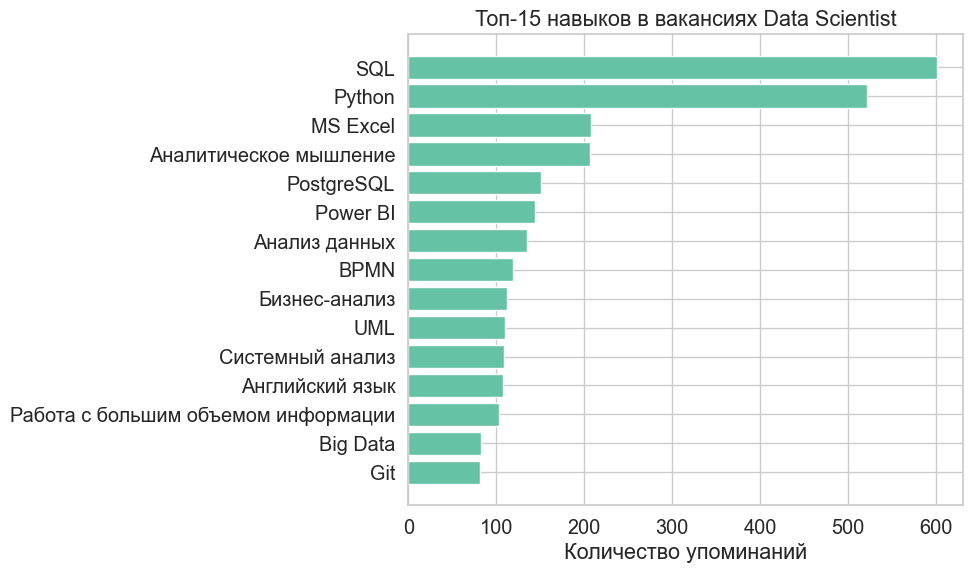

In [98]:
all_skills = []

for skills in df_detailed["key_skills"]:
    if pd.notnull(skills):
        all_skills.extend([s.strip() for s in skills.split(",")])

skill_counts = Counter(all_skills)
top_skills = skill_counts.most_common(15)

skills, counts = zip(*top_skills)

plt.figure(figsize=(10, 6))
plt.barh(skills[::-1], counts[::-1])
plt.title("Топ-15 навыков в вакансиях Data Scientist")
plt.xlabel("Количество упоминаний")
plt.tight_layout()
plt.show()

**Вопрос 3.** Какую зарплату готовы платить работодатели? Соберите некоторым образом статистику и постройте гистограмму.

In [87]:
df = df_detailed.copy()

Я придумала что делать в слкчае с каждой из комбинаций от/до и гросс/брот. Они довольно простые и там просто коэффициеты.

In [88]:
currency_rates = {
    "RUR": 1,
    "USD": 80,
    "EUR": 90,
}

def convert_salary(row):
    salary = row.get("salary_from") or row.get("salary_to")
    rate = currency_rates.get(row["currency"], None)
    if rate is None or salary is None:
        return np.nan

    sal_from = row["salary_from"]
    sal_to = row["salary_to"]
    gross = row.get("gross", None)

    if sal_from:
        sal_from *= rate
    if sal_to:
        sal_to *= rate

    if sal_from and sal_to:
        avg = (sal_from + sal_to) / 2
    elif sal_from:
        avg = sal_from * 1.25
    elif sal_to:
        avg = sal_to * 0.8
    else:
        return np.nan

    if gross is True:
        avg *= 0.87

    return avg

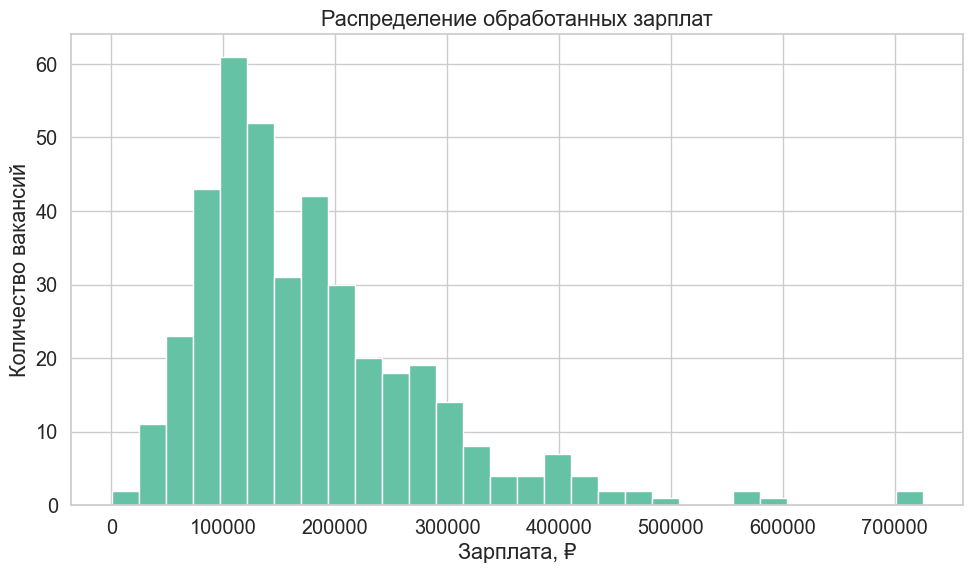

In [89]:
df["processed_salary"] = df.apply(convert_salary, axis=1)
df = df[df["processed_salary"].notnull()]

plt.figure(figsize=(10, 6))
plt.hist(df["processed_salary"], bins=30)
plt.title("Распределение обработанных зарплат")
plt.xlabel("Зарплата, ₽")
plt.ylabel("Количество вакансий")
plt.tight_layout()
plt.show()

**Вопрос 4.** Какой формат работы предлагается (в офисе / удаленно / ...)?

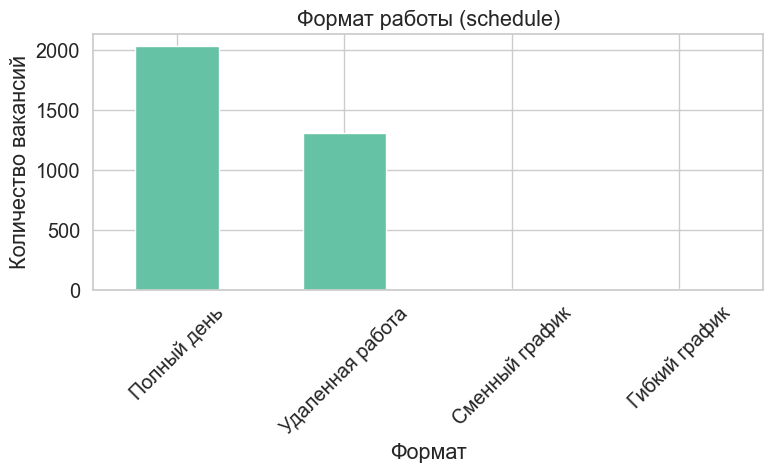

In [91]:
schedule_counts = df_detailed["schedule"].value_counts()

plt.figure(figsize=(8, 5))
schedule_counts.plot(kind="bar")
plt.title("Формат работы (schedule)")
plt.xlabel("Формат")
plt.ylabel("Количество вакансий")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Проведите аналогичный анализ для наиболее привлекательной для вас профессии в любом регионе. Если это Data Scientist, то для анализа выберите другую.

In [53]:
keywords = ["C++ backend", "C++ разработчик", "C++ developer", "C++ engineer", "C++ программист", "backend разработчик C++", "программист C++ backend"]

all_vacancies_1 = []

for keyword in keywords:
    for page in range(20):
        params = {
            "text": keyword,
            "area": 1,
            "page": page,
            "per_page": 100,
        }
        response = requests.get(URL, params=params)
        data = response.json()
        
        if 'items' in data:
            all_vacancies_1.extend(data["items"])

        if page >= data.get("pages", 0) - 1:
            break

In [54]:
unique_vacancies_1 = {vac["id"]: vac for vac in all_vacancies_1}
all_vacancies = list(unique_vacancies_1.values())
len(unique_vacancies_1)

1229

In [71]:
detailed_vacancies_1 = []

for i, vacancy_id in enumerate(unique_vacancies_1):
    vacancy_url = f"https://api.hh.ru/vacancies/{vacancy_id}"

    try:
        req = requests.get(vacancy_url, timeout=5)
        req.raise_for_status()
        vacancy_info = json.loads(req.content.decode())
    except requests.exceptions.RequestException as e:
        print(f"Ошибка {vacancy_id}: {e}")
        continue

    detailed_vacancies_1.append({
    "id": vacancy_info["id"],
    "name": vacancy_info["name"],
    "company": vacancy_info["employer"]["name"] if vacancy_info.get("employer") else None,
    "description": vacancy_info["description"],
    "experience": vacancy_info["experience"]["name"] if vacancy_info.get("experience") else None,
    "employment": vacancy_info["employment"]["name"] if vacancy_info.get("employment") else None,
    "schedule": vacancy_info["schedule"]["name"] if vacancy_info.get("schedule") else None,
    "area": vacancy_info["area"]["name"] if vacancy_info.get("area") else None,
    "address": vacancy_info["address"]["raw"] if vacancy_info.get("address") else None,
    "salary_from": vacancy_info["salary"]["from"] if vacancy_info.get("salary") else None,
    "salary_to": vacancy_info["salary"]["to"] if vacancy_info.get("salary") else None,
    "currency": vacancy_info["salary"]["currency"] if vacancy_info.get("salary") else None,
    "gross": vacancy_info["salary"]["gross"] if vacancy_info.get("salary") and "gross" in vacancy_info["salary"] else None,
    "key_skills": ", ".join([s["name"] for s in vacancy_info.get("key_skills", [])]),
    "published_at": vacancy_info["published_at"],
    "url": vacancy_info["alternate_url"],
    })
    
    sleep(0.2)

df_detailed_1 = pd.DataFrame(detailed_vacancies_1)
df_detailed_1.to_excel("detailed_vacancies_2.xlsx", index=False)

In [72]:
df_detailed_1.head()

,id,name,company,description,experience,employment,schedule,area,address,salary_from,salary_to,currency,gross,key_skills,published_at,url
0,120516983,Senior QA Engineer,Xello,"<p>Xello – IT-компания, прошедшая путь от стар...",От 3 до 6 лет,Полная занятость,Полный день,Москва,None,NaN,NaN,None,None,"Docker, Git, PostgreSQL, Atlassian Jira, Bash,...",2025-05-14T10:22:26+0300,https://hh.ru/vacancy/120516983
1,120650921,Rust developer,(Blockchair) ЧК GROUCHY MAINFRAME LTD.,<p><strong>О проекте</strong></p> <p>Blockchai...,От 1 года до 3 лет,Полная занятость,Полный день,Москва,"Москва, Славянский бульвар",NaN,NaN,None,None,"Rust, Monero, Bitcoin, C++, Git, SQL, Linux",2025-05-16T19:43:49+0300,https://hh.ru/vacancy/120650921
2,120171387,Backend-разработчик (junior),Геоскан,<p><strong>Геоскан –</strong> российская групп...,Нет опыта,Полная занятость,Полный день,Москва,"Москва, Раменский бульвар, 1",NaN,NaN,None,None,"Python, C++, SQL, HTTP, WS, MAVLink",2025-05-02T15:40:21+0300,https://hh.ru/vacancy/120171387
3,120644757,Старший тестировщик ПО / QA Automation,IndigoSoft,<p>Компания<strong> Indigosoft</strong> являет...,От 3 до 6 лет,Полная занятость,Удаленная работа,Москва,None,NaN,NaN,None,None,"Google Chrome, Figma, TestOps, Тестирование, А...",2025-05-16T16:26:29+0300,https://hh.ru/vacancy/120644757
4,119531965,Тестировщик (QA),ИНТСИС,<p>Формат работы: гибрид без фиксированных дне...,От 1 года до 3 лет,Полная занятость,Полный день,Москва,"Москва, Большая Новодмитровская улица, 14с3",NaN,NaN,None,None,,2025-05-07T16:52:08+0300,https://hh.ru/vacancy/119531965


In [73]:
len(df_detailed_1) # всего вакансий

1229

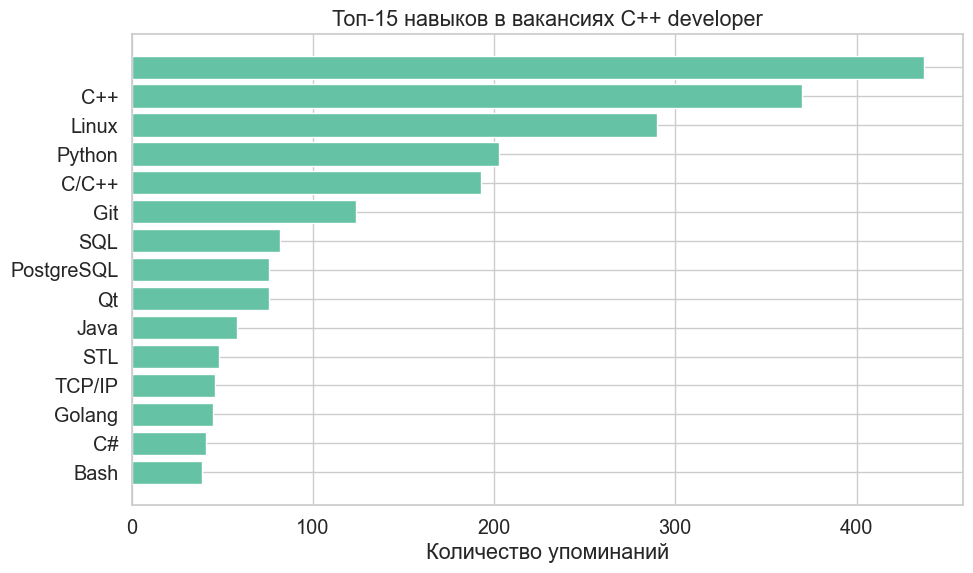

In [74]:
all_skills = []

for skills in df_detailed_1["key_skills"]:
    if pd.notnull(skills):
        all_skills.extend([s.strip() for s in skills.split(",")])

skill_counts = Counter(all_skills)
top_skills = skill_counts.most_common(15)

skills, counts = zip(*top_skills)

plt.figure(figsize=(10, 6))
plt.barh(skills[::-1], counts[::-1])
plt.title("Топ-15 навыков в вакансиях C++ developer")
plt.xlabel("Количество упоминаний")
plt.tight_layout()
plt.show()

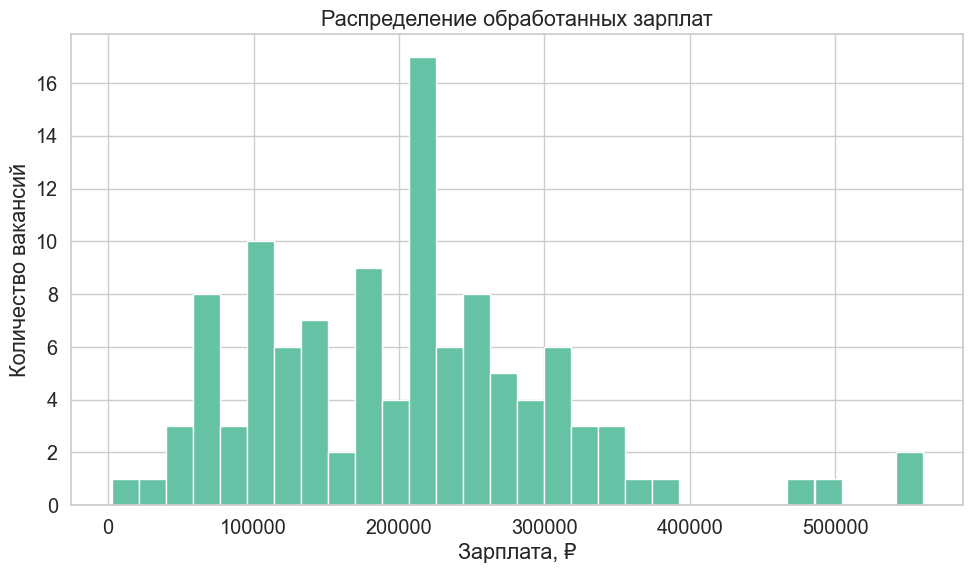

In [79]:
df = df_detailed_1.copy()
df["processed_salary"] = df.apply(convert_salary, axis=1)
df = df[df["processed_salary"].notnull()]

plt.figure(figsize=(10, 6))
plt.hist(df["processed_salary"], bins=30)
plt.title("Распределение обработанных зарплат")
plt.xlabel("Зарплата, ₽")
plt.ylabel("Количество вакансий")
plt.tight_layout()
plt.show()

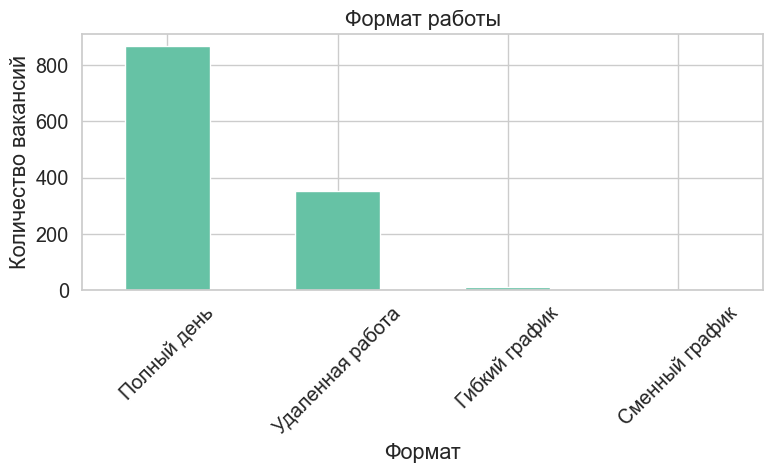

In [112]:
schedule_counts = df_detailed_1["schedule"].value_counts()

plt.figure(figsize=(8, 5))
schedule_counts.plot(kind="bar")
plt.title("Формат работы")
plt.xlabel("Формат")
plt.ylabel("Количество вакансий")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

1. Основное что требуется, чтобы работать в DS это SQL и Python. Если честно, это несколько удивительно, потому что если судить по заданиям этого курса SQL если и требуется, то в небольших количествах.  
2. Разброс о ЗП очень большой, но это связано с тем, что вакансии не разбиваются на группы в зависимости от опыта, позиции и т.п.  
3. Примерно 2/3 компаний просят сотрудников работать из офиса, а остальные предлагают работать из дома.  
4. Вакансий связанных с бэкэнд разработкой на плюсах по сравнению с DSом довольно мало, примерно в три раза. Там ключевые навыки это С++ (логично:-)) и Linux, скорее всего для того, чтобы пользоваться терминалом. Очень удивительно, что в требованиях часто встречается Python.  
5. Разброс зарплат такой же сильный как в DS, но он более размазан. Скорее всего для разработчиков более размазанный рост зп без смены позиции.  
6. Бэкэндеры должны работать в офисе чаще чем DSеры (количество вакансий в офисе больше 2/3, в DS меньше 2/3).

---
Для *одной* из рассмотренных ранее профессий исследуйте, в каком районе Москвы данная вакансия пользуется наибольшим и наименьшим спросом.

In [109]:
geolocator = Nominatim(user_agent="hh_mapper", timeout=10)
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

In [110]:
df_detailed["address_full"] = df_detailed["address"].fillna("") + ", Москва"

In [127]:
mask = df_detailed["address"].notna()
count_with_salary = mask.sum()
count_with_salary

1635

In [124]:
df_detailed["address"]

0                                          NaN
1                                          NaN
2                                          NaN
3                                          NaN
4       Москва, 17-й проезд Марьиной Рощи, 4к1
                         ...                  
3351            Москва, улица Годовикова, 9с10
3352            Москва, улица Годовикова, 9с10
3353                                       NaN
3354            Москва, улица Годовикова, 9с10
3355            Москва, улица Годовикова, 9с10
Name: address, Length: 3356, dtype: object

In [ ]:
tqdm.pandas()

def get_location(address):
    try:
        return geocode(address)
    except Exception:
        return None

df_detailed["location_geo"] = df_detailed["address_full"].progress_apply(get_location)

100%|██████████| 3356/3356 [56:24<00:00,  1.01s/it] 


In [113]:
df_detailed["latitude"] = df_detailed["location_geo"].apply(lambda loc: loc.latitude if loc else None)
df_detailed["longitude"] = df_detailed["location_geo"].apply(lambda loc: loc.longitude if loc else None)

In [114]:
df_detailed.to_csv("df_detailed_with_coords.csv", index=False)

In [115]:
import plotly.express as px

df_map = df_detailed.dropna(subset=["latitude", "longitude"])

fig = px.scatter_mapbox(
    df_map,
    lat="latitude",
    lon="longitude",
    hover_name="name",
    hover_data=["company", "employment", "salary_from", "salary_to"],
    color_discrete_sequence=["blue"],
    zoom=10,
    height=600
)
fig.update_layout(
    mapbox_style="open-street-map",
    title="Расположение вакансий по Москве",
    margin={"r":0,"t":30,"l":0,"b":0}
)

fig.show()

Что из адресов получить широту и долготу получилось очень плохо и такой метод не подходит для требуемого в задаче анализа.

---

Проверьте, во скольких вакансиях среди выгруженных указана зарплата?


In [99]:
mask = df_detailed["salary_from"].notna() | df_detailed["salary_to"].notna()
count_with_salary = mask.sum()
print(count_with_salary)

945


На основе описания вакансий с известной зарплатой попробуйте оценить ожидаемую зарплату для всех остальных вакансий. 

In [ ]:
df = df_detailed.copy()
df["salary"] = df.apply(convert_salary, axis=1)
df = df.dropna(subset=["description", "salary"])
X_text = df["description"]
y = df["salary"]

X_train_text, X_test_text, y_train, y_test = train_test_split(X_text, y, test_size=0.2, random_state=42)
tfidf = TfidfVectorizer(max_features=10000, stop_words=None)
X_train_tfidf = tfidf.fit_transform(X_train_text)
X_test_tfidf = tfidf.transform(X_test_text)

model = CatBoostRegressor(iterations=300, verbose=100, task_type="CPU")
model.fit(X_train_tfidf, y_train)

y_pred = model.predict(X_test_tfidf)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse:.2f}")


Learning rate set to 0.091101
0:	learn: 102711.2242629	total: 104ms	remaining: 31s
100:	learn: 33717.8810404	total: 9.28s	remaining: 18.3s
200:	learn: 12384.2022593	total: 18.4s	remaining: 9.06s
299:	learn: 5187.0132600	total: 27.5s	remaining: 0us
RMSE: 91885.42


In [132]:
df_missing_salary = df_detailed[
    df_detailed["salary_from"].isna() & 
    df_detailed["salary_to"].isna() & 
    df_detailed["description"].notna()
].copy()

X_missing_tfidf = tfidf.transform(df_missing_salary["description"])
df_missing_salary["predicted_salary"] = model.predict(X_missing_tfidf)

df_with_predicted = df_detailed.copy()
df_with_predicted.loc[df_missing_salary.index, "predicted_salary"] = df_missing_salary["predicted_salary"]

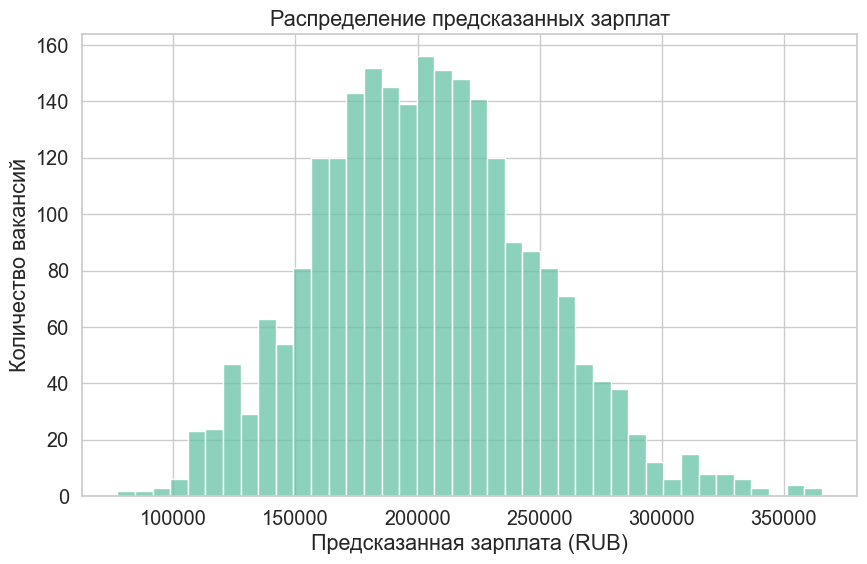

In [134]:
import matplotlib.pyplot as plt
import seaborn as sns

predicted_only = df_missing_salary["predicted_salary"].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(predicted_only, bins=40)
plt.title("Распределение предсказанных зарплат")
plt.xlabel("Предсказанная зарплата (RUB)")
plt.ylabel("Количество вакансий")
plt.show()


Выполните кластеризацию вакансии.

In [ ]:
# я все скидываю в один датафрейм и потом там всё заново делаю
df_all = df_detailed.copy()
df_all["description"] = df_all["description"].fillna("")
df_all["salary"] = df_all.apply(convert_salary, axis=1)

tfidf = TfidfVectorizer(max_features=10000)
X_all_tfidf = tfidf.fit_transform(df_all["description"]) 

svd = TruncatedSVD(n_components=2, random_state=42)
X_reduced = svd.fit_transform(X_all_tfidf)

kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_all_tfidf)

df_all["Cluster"] = clusters
df_all["Component 1"] = X_reduced[:, 0]
df_all["Component 2"] = X_reduced[:, 1]

fig = px.scatter(
    df_all,
    x="Component 1",
    y="Component 2",
    color="Cluster",
    symbol=df_all["salary"].isna().map({True: "Без ЗП", False: "С ЗП"}),
    hover_data=["description", "salary"],
)
fig.show()

In [142]:
num_examples = 5

for cluster_id in sorted(df_all["Cluster"].unique()):
    print(f"Кластер {cluster_id}:")
    
    cluster_rows = df_all[df_all["Cluster"] == cluster_id]
    
    examples = cluster_rows[["name", "salary", "description"]].head(num_examples)
    
    for idx, row in examples.iterrows():
        print(f"  Название вакансии: {row['name']}")
        print(f"  Ожидаемая зарплата: {row['salary']}")
        print(f"  Описание:{row['description']}")
    
    print("-" * 80 + "\n")


Кластер 0:
  Название вакансии: ML Engineer / Data Scientist
  Ожидаемая зарплата: 300000.0
  Описание:<p><strong>Основной разработчик систем физической защиты в России (СКУД, системы видеомониторинга, системы защиты воздушного пространства и тд) в поисках квалифицированного ML инженера</strong></p> <p><strong>Обязанности:</strong></p> <p>1. Разрабатывать и внедрять решения в области компьютерного зрения, анализа данных и машинного обучения (от сбора данных и проверки гипотез до реализации, оценки качества) для системы видеонаблюдения.</p> <p>2. Анализ эффективности разрабатываемых алгоритмов на основе результатов тестирования и выполнение работ по корректировке моделей.</p> <p>3. Осуществлять взаимодействия с другими членами команды в целях встраивания разрабатываемых алгоритмов и полезных моделей в программное обеспечение.</p> <p>4. Документирование результатов и подготовка отчетов.</p> <p><strong>Требования:</strong></p> <ol> <li>Знание С++; Qt; Pyton;</li> <li>Знание библиотек и фр

У меня очень плохо получается интерепретировать результаты, но вот признаки, которые мне удалось выделить:  

0. Кажется это более MLная область (там что связано именно с машинкой).  
1. Тоже про МЛ много, но ещё упоминается BigData.  
2. Единственное что я заметила, что требуются softskills.  
3. Вообще нет идей.

В этой задаче решение получилось довольно плохим. Я использовала просто обычную модель для предсказания зп, распределение предсказанных зп довольно сильно отличается от того, что у вакансий, где зп указана. Это может быть связано с тем что плохая работа, но в целом теоретически может быть, что выборка тех компаний, которые показывают зп не очень репрезентативная. Кластеризация получилась очень странной. Визуально на графике она выглядит неплохо, но при попытке интерепретировать результаты происходит катастрофа.